<a href="https://colab.research.google.com/github/Fxyzgit/mimikit-notebooks/blob/main/demos/colab/fxyz_freqnet.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [21]:
! pip install neptune-client

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 438 kB 7.1 MB/s 
     |████████████████████████████████| 55 kB 3.9 MB/s 
     |████████████████████████████████| 132 kB 64.9 MB/s 
     |████████████████████████████████| 182 kB 66.9 MB/s 
     |████████████████████████████████| 10.1 MB 58.9 MB/s 
     |████████████████████████████████| 79 kB 8.5 MB/s 
     |████████████████████████████████| 140 kB 72.6 MB/s 
     |████████████████████████████████| 67 kB 6.9 MB/s 
     |████████████████████████████████| 130 kB 68.4 MB/s 
     |████████████████████████████████| 62 kB 1.2 MB/s 
     |████████████████████████████████| 127 kB 63.9 MB/s 
     |████████████████████████████████| 66 kB 5.2 MB/s 
  Attempting uninstall: urllib3
    Found existing installation: urllib3 1.24.3
    Uninstalling urllib3-1.24.3:
      Successfully uninstalled urllib3-1.24.3


In [22]:
import neptune.new as neptune

ImportError: ignored

In [ ]:
from getpass import getpass

api_token = getpass("Enter your private Neptune API token: ")

In [ ]:
run = neptune.init_run(api_token=api_token,
                   project="fxyz/mimi-generate-bill")

## Connect to your GDrive 
In order to train the network on your data, create a directory named `data/`
in the current working directory (cwd) of this notebook (when on colab and connected to gdrive
this would be the `MyDrive/` directory in your gdrive account) and put audio files in it. 

In [ ]:
from google.colab import drive
drive.mount('/gdrive')
# this set the cwd of the notebook
%cd /gdrive/MyDrive 

### Install `mimikit`

In [ ]:
%pip uninstall torchtext -y
%pip install mimikit[colab]==0.3.4

In [ ]:
# colab crashes if following import is done within mimikit
import pytorch_lightning as pl

### Load Data

In [ ]:
import mimikit as mmk
import h5mapper as h5m
import os


# list of files or directories to use as data ("./" is the cwd of the notebook)
sources = ['./data']
# audio sample rate
sr = 22050
# the size of the stft
n_fft = 2048
# hop_length of the stft
hop_length = n_fft // 4

db_path = "train.h5"
if os.path.exists(db_path):
    os.remove(db_path)

class SoundBank(h5m.TypedFile):
    snd = h5m.Sound(sr=sr, mono=True, normalize=True)

SoundBank.create(db_path, sources)
soundbank = SoundBank(db_path, mode='r', keep_open=True)



### Configure and run training

****************************************************
ID IS : 4f86165fb0864cc2bbd86c149ddd0de9e0509ac5217e5cbfa461faf722a49288
****************************************************


INFO:pytorch_lightning.utilities.distributed:GPU available: True, used: True
INFO:pytorch_lightning.utilities.distributed:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.distributed:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.accelerators.gpu:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.core.lightning:
  | Name | Type       | Params
------------------------------------
0 | net  | WaveNetFFT | 10.5 M
------------------------------------
10.5 M    Trainable params
0         Non-trainable params
10.5 M    Total params
41.984    Total estimated model params size (MB)


  0%|          | 0/99 [00:00<?, ?epoch/s]

Training: -1it [00:00, ?it/s]

Epoch 0 - loss : 0.8033 


/usr/local/lib/python3.7/dist-packages/pytorch_lightning/loops/epoch/training_epoch_loop.py:284: LightningDeprecationWarning: The signature of `ModelHooks.on_train_epoch_end` has changed in v1.3. `outputs` parameter has been deprecated. Support for the old signature will be removed in v1.5
  "The signature of `ModelHooks.on_train_epoch_end` has changed in v1.3."


Epoch 1 - loss : 0.6144 
Epoch 2 - loss : 0.4285 
Epoch 3 - loss : 0.3180 
Epoch 4 - loss : 0.2601 
Epoch 5 - loss : 0.2228 
Epoch 6 - loss : 0.1969 
Epoch 7 - loss : 0.1792 
Epoch 8 - loss : 0.1653 
Epoch 9 - loss : 0.1541 


Generate:   0%|          | 0/1032 [00:00<?, ?step/s]

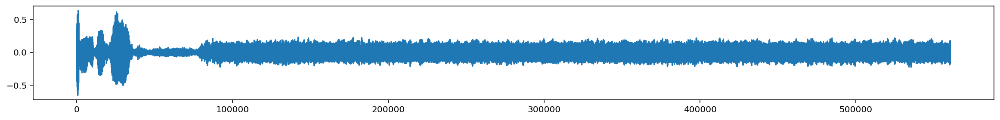

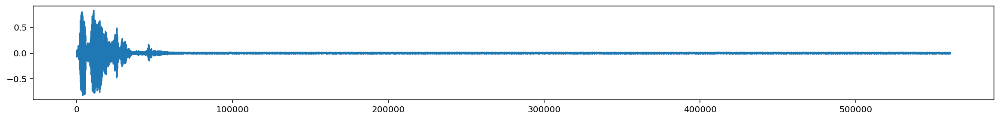

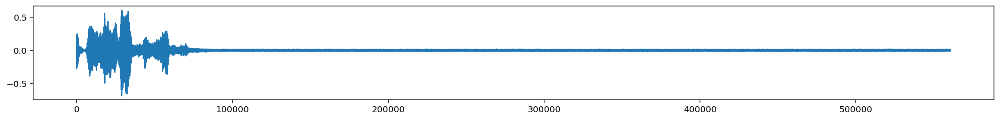

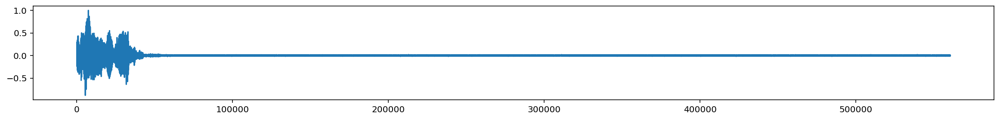

Epoch 10 - loss : 0.1458 
Epoch 11 - loss : 0.1385 
Epoch 12 - loss : 0.1314 
Epoch 13 - loss : 0.1259 
Epoch 14 - loss : 0.1220 
Epoch 15 - loss : 0.1181 
Epoch 16 - loss : 0.1143 
Epoch 17 - loss : 0.1115 
Epoch 18 - loss : 0.1097 
Epoch 19 - loss : 0.1051 


Generate:   0%|          | 0/1032 [00:00<?, ?step/s]

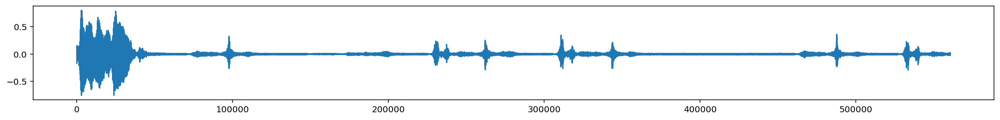

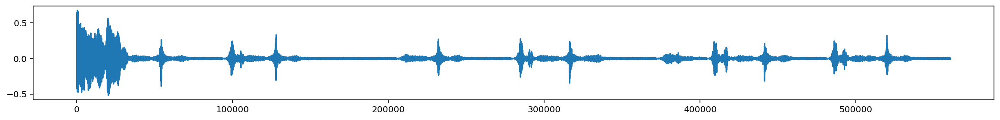

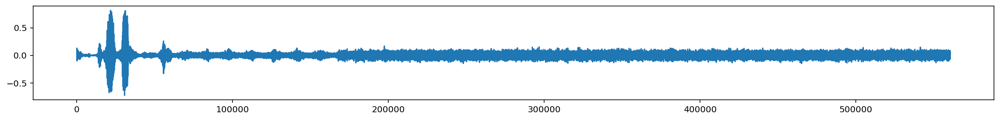

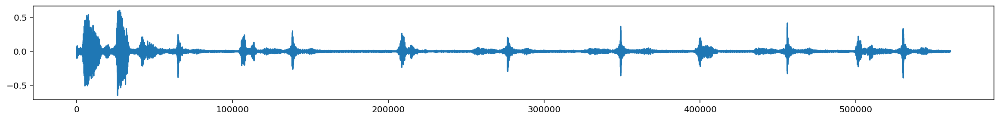

Epoch 20 - loss : 0.1039 
Epoch 21 - loss : 0.1006 
Epoch 22 - loss : 0.0981 
Epoch 23 - loss : 0.0964 
Epoch 24 - loss : 0.0943 
Epoch 25 - loss : 0.0927 
Epoch 26 - loss : 0.0908 
Epoch 27 - loss : 0.0900 
Epoch 28 - loss : 0.0870 
Epoch 29 - loss : 0.0858 


Generate:   0%|          | 0/1032 [00:00<?, ?step/s]

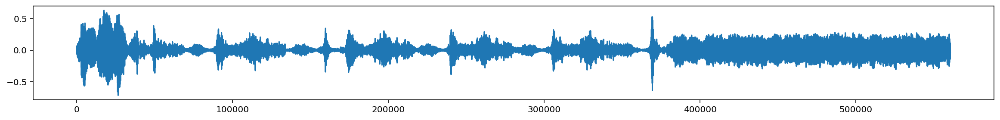

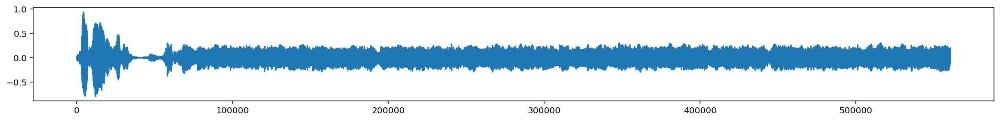

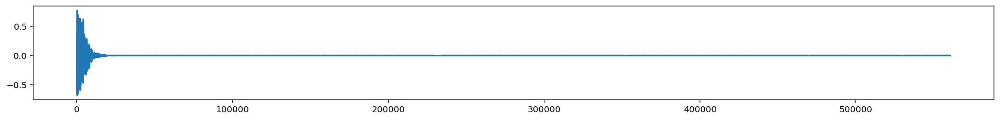

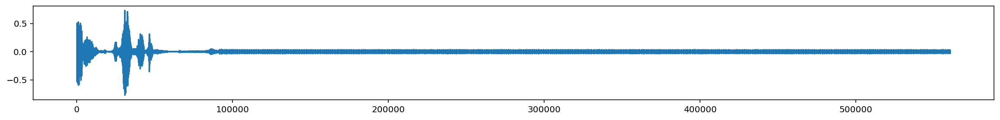

Epoch 30 - loss : 0.0850 
Epoch 31 - loss : 0.0834 
Epoch 32 - loss : 0.0820 
Epoch 33 - loss : 0.0799 


/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/trainer.py:1051: UserWarning: Detected KeyboardInterrupt, attempting graceful shutdown...
  rank_zero_warn("Detected KeyboardInterrupt, attempting graceful shutdown...")


Training finished after 0 days 0 hours 25 mins 45 seconds


(TrainLoop(
   (net): WaveNetFFT(
     (0): HOM(
       (0): Chunk(
         (0): Linear(in_features=1025, out_features=1024, bias=False)
         (1): functools.partial(<built-in method chunk of type object at 0x7f734b916940>, chunks=1, dim=-1)
         (2): <function Sum.<locals>.<lambda> at 0x7f72684929e0>
       )
     )
     (1): HOM(
       (0): <function Map.<locals>.<lambda> at 0x7f726848bdd0>
       (1): WNLayer(
         (0): CausalPad()
         (1): Chunk(
           (0): Conv1d(1024, 2048, kernel_size=(2,), stride=(1,), groups=2)
           (1): functools.partial(<built-in method chunk of type object at 0x7f734b916940>, chunks=2, dim=1)
         )
         (2): GatingUnit(
           (0): Tanh()
           (1): Sigmoid()
           (2): <built-in function mul>
         )
       )
       (2): WNLayer(
         (0): CausalPad()
         (1): Chunk(
           (0): Conv1d(1024, 2048, kernel_size=(2,), stride=(1,), dilation=(2,), groups=2)
           (1): functools.partial(<bu

In [20]:
# INPUT / TARGET

feature = mmk.Spectrogram(
    sr=SoundBank.snd.sr,
    n_fft=n_fft,
    hop_length=hop_length,
    coordinate='mag',
    center=False
)

# NETWORK

net = mmk.WaveNetFFT(
    feature=feature,
    input_heads=1,
    output_heads=1,
    scaled_activation=False,

    # number of layers (per block)
    blocks=(4,),
    # dimension of the layers
    dims_dilated=(1024,),
    groups=2,

)
net.use_fast_generate = False

from time import sleep

params = {"learning_rate": 0.1}

# log params
run["parameters"] = params

# log name and append tags
run["sys/name"] = "colab-example"
run["sys/tags"].add(["colab", "simple"])

# log loss during training
for epoch in range(132):
    sleep(0.1)  # to see logging live
    run["train/loss"].log(0.97**epoch)
    run["train/loss-pow-2"].log((0.97**epoch) ** 2)

# log train and validation scores
run["train/accuracy"] = 0.95
run["valid/accuracy"] = 0.93

# log files/artifacts
! echo "Welcome to Neptune" > file.txt
run["artifacts/sample"].upload("file.txt")  # file will be uploaded as sample.txt

# OPTIMIZATION LOOP

mmk.train(
    soundbank,
    net,
    root_dir="./",
    input_feature=feature,
    target_feature=feature,

    # BATCH

    batch_size=4,
    batch_length=64,
    downsampling=feature.hop_length // 1,
    shift_error=0,

    # OPTIM

    max_epochs=100,
    limit_train_batches=None,

    max_lr=1e-3,
    betas=(0.9, 0.9),
    div_factor=3.,
    final_div_factor=1.,
    pct_start=0.,
    cycle_momentum=False,
    reset_optim=False,

    # MONITORING / OUTPUTS

    CHECKPOINT_TRAINING=True,
    MONITOR_TRAINING=True,
    OUTPUT_TRAINING="",

    every_n_epochs=10,
    n_examples=4,
    prompt_length=64,
    n_steps=int(12 * (feature.sr // feature.hop_length)),
)



In [ ]:
run.stop()

----------------------------

<img src="https://ktonal.com/k-circle-bw.png" alt="logo" width="75"/>